https://www.kaggle.com/competitions/kaggle-pog-series-s01e03/data


# Corn Seed Image Classification
It's Corn (PogChamps #3)

## Import libraries

In [1]:
from IPython.display import clear_output

import pandas as pd
import numpy as np
import tqdm

from PIL import Image
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix

import torch
import torch.nn as nn
from torchvision import models
from torch.utils.data import random_split, Dataset, DataLoader 
import torch.nn.functional as F
from torch.utils.data import Subset
import pickle       
import math

import timm

import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2

import gc
import seaborn as sns

from torchinfo import summary

import matplotlib.image as mpimg


def show_image(inp, title=None):
    if type(inp) is torch.Tensor:
        inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)

def reverse_dict(inp_dict: dict):
    return {v:k for k,v in inp_dict.items()}

def clear_gpu() -> None:
    torch.clear_autocast_cache()
    torch.cuda.ipc_collect()
    torch.cuda.empty_cache()
    gc.collect()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

valid_tfms = A.Compose([
    A.Resize(width=224, height=224),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

train_tfms = A.Compose([
    A.Resize(width=224, height=224),
    A.Rotate(p=0.5, border_mode=cv2.BORDER_REPLICATE),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

paths = {
    'corn_root': 'corn',
    'test_csv': 'corn/test.csv',
    'train_csv': 'corn/train.csv',
}

ltoi = {
    'broken': 0, 
    'pure': 1, 
    'discolored': 2, 
    'silkcut': 3
}

itol = reverse_dict(ltoi)

gen = torch.Generator()
gen.manual_seed(0)

e:\ProgramData\anaconda3\envs\cute\lib\site-packages\transformers\utils\hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


cuda


In [58]:
def plot_training(losses, title='Loss over time'):
    clear_output(wait=True)
    plt.plot(losses)
    plt.title(title)
    plt.xlabel('Step')
    plt.ylabel('Loss')
    plt.show()

def smooth_data(data, window_size=50):
    # Pad the data with the same value at the edges
    padded_data = np.pad(data, (window_size//2, window_size//2), 'edge')

    # Create smoothed line for the padded data
    smooth = np.convolve(padded_data, np.ones(window_size)/window_size, mode='same')

    # Remove the padding from the smoothed data
    smooth = smooth[window_size//2:-window_size//2]

    return smooth

def plot_losses_smooth(losses, title, ylabel="CrossEntropyLoss", portion=2):
    numbers = np.array(losses)

    # Split the list into two halves
    mid = len(numbers) // portion
    first_half = numbers[:mid]
    second_half = numbers[mid:]

    # Create x values
    x1 = np.arange(len(first_half))
    x2 = np.arange(len(first_half), len(numbers))

    # Create smoothed lines
    smooth = smooth_data(numbers)

    # Plot the numbers
    plt.plot(x1, first_half, 'r')
    plt.plot(x2, second_half, 'g')
    plt.plot(smooth, 'b-')
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel("Step")
    plt.show()

def plot_multi_losses_smooth(losses_A, losses_B, title, 
                             legend_A, legend_B, ylabel="CrossEntropyLoss"):
    numbers_A = np.array(losses_A)
    numbers_B = np.array(losses_B)

    # Create smoothed lines
    smooth_A = smooth_data(numbers_A)
    smooth_B = smooth_data(numbers_B)

    # Plot the numbers
    plt.plot(smooth_A, 'r', label=legend_A)  # Add label for legend
    plt.plot(smooth_B, 'b', label=legend_B)  # Add label for legend
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel("Step")
    plt.legend()  # Display the legend
    plt.show()

def load_images(image_paths, root_path):
    # Load the images from the paths
    return [mpimg.imread(f"{root_path}/{path}") for path in image_paths]


def plot_images(images, label, num_images, ncols):
    # Determine the number of rows and columns for the subplots
    
    nrows = int(np.ceil(num_images / ncols))

    # Create a figure with a grid of subplots
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 7))

    # Flatten the axes for easy iteration
    axs = axs.flatten()

    # Iterate over the images and plot them
    for i, img in enumerate(images):
        axs[i].imshow(img)
        axs[i].axis('off')

    # Remove unused subplots
    for i in range(num_images, nrows*ncols):
        fig.delaxes(axs[i])

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
    plt.suptitle(label)
    fig.tight_layout()
    plt.tight_layout()
    # Show the plot
    plt.show()

def plot_images_sample(train_df, label, paths, num_images, ncols=5):
    # Extract the file paths for the given label
    image_paths = train_df['image'].sample(num_images)

    # Load the images
    images = load_images(image_paths, paths['corn_root'])

    # Plot the images
    plot_images(images, label, num_images, ncols)

def create_heatmap(conf_matrix, title):
    # Create a heatmap
    plt.figure(figsize=(5, 3))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')

    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    return plt.gca()

def set_axis_labels(ax, itol):
    # Set x and y ticks
    ax.set_xticklabels([itol[tick] for tick in ax.get_xticks().astype(int)])
    ax.set_yticklabels([itol[tick] for tick in ax.get_yticks().astype(int)])
    plt.setp(ax.get_yticklabels(), rotation=0)

def confuse_plot(conf_matrix, title, itol):
    ax = create_heatmap(conf_matrix, title)
    set_axis_labels(ax, itol)
    plt.show()
    
def plot_counts(df, groupby_column, counts, xlabel, ylabel, title):
    counts = df.groupby([groupby_column]).size()
    
    # Create a bar plot of the counts
    counts.plot(kind='bar')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()
    
def calculate_percentages(df, groupby_column):
    counts = df.groupby([groupby_column]).size()

    total_count = sum(counts)
    return [(count / total_count) * 100 for count in counts]

def plot_data(df, groupby_column, ltoi):
    counts = df.groupby([groupby_column]).size()
    total_count = sum(counts)
    percentages = [(count / total_count) * 100 for count in counts]
    
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Bar chart for counts
    ax1.bar(ltoi.keys(), counts)
    ax1.set_xlabel('Label')
    ax1.set_ylabel('Count')
    ax1.set_title('Label Counts')

    # Pie chart for percentages
    ax2.pie(percentages, labels=ltoi.keys(), autopct='%.1f%%', shadow=False)
    ax2.set_title('Label Percentages')

    plt.tight_layout()
    plt.show()
    
def normalize_confusion_matrix(conf_matrix):
    row_sums = conf_matrix.sum(axis=1, keepdims=True)
    normalized_matrix = conf_matrix / row_sums
    return normalized_matrix

def plot_normalized_confusion_matrix(conf_matrix, title):
    normalized_matrix = normalize_confusion_matrix(conf_matrix)
    print(normalized_matrix)
    
    plt.figure(figsize=(5, 3))
    sns.heatmap(normalized_matrix, annot=True, fmt='.2f', cmap='Blues')
    
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    ax = plt.gca()
    ax.set_xticklabels([itol[tick] for tick in ax.get_xticks().astype(int)])
    ax.set_yticklabels([itol[tick] for tick in ax.get_yticks().astype(int)])
    plt.setp(ax.get_yticklabels(), rotation=0)
    
    plt.show()
    
def autolabel(rects, ax, float_fmt):
    for rect in rects:
        height = rect.get_height()
        text = f'{height:.2f}' if float_fmt else f'{height}'
        ax.annotate(text,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

def plot_actuals(confs, names, ltoi, title='Actuals', float_fmt=False):
    labels = ltoi.keys()
    x = np.arange(len(labels))
    width = 0.2 

    fig, ax = plt.subplots()
    rects = []
    for i, (conf, name) in enumerate(zip(confs, names)):
        rect = ax.bar(x + (i-1.5)*width, np.diag(conf), width, label=name)
        rects.append(rect)

    # Call the function to add labels
    for rect in rects:
        autolabel(rect, ax, float_fmt)

    ax.set_xlabel('Classes')
    ax.set_ylabel('Actuals')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    fig.tight_layout()

    plt.show()
    
def plot_accuracies(accuracies, colors, labels):
    for i, accuracy in enumerate(accuracies):
        plt.bar(i, accuracy, label=labels[i])

        # Add the actual value as a text label
        plt.text(i, accuracy, f"{accuracy:.4f}", ha='center', va='bottom')
    
    plt.title('Accuracies')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.axis('off')
    plt.show()
    
def plot_attn_map(image_tensor, label, model, model_name, gamma=0.3):
    model.eval()
    
    with torch.no_grad():
        output, weights = model(image_tensor)
        
    pred = itol[torch.argmax(output).item()]
    truth = itol[label]
    
    # Assuming 'weights' is a torch tensor with values between 0 and 1
    enhanced_weights = weights**gamma
    
    # Create a plot
    plt.figure(figsize=(10, 5))

    # Original weights plot
    plt.subplot(1, 2, 1)
    plt.imshow(weights.squeeze().cpu())
    plt.title("Original Weights")

    # Enhanced weights plot
    plt.subplot(1, 2, 2)
    plt.imshow(enhanced_weights.squeeze().cpu())
    plt.title("Enhanced Weights")
    # plt.colorbar()

    plt.suptitle(f"{model_name} Attention activation map (pred={pred}, truth={truth})")
    plt.tight_layout()
    plt.show()
    
def mean_across_channels(output):
    feature_map = torch.sum(output, 0) / output.shape[0]
    plt.imshow(feature_map.cpu())
    return feature_map

def plot_feature_maps_meaned(layers_outputs, num_cols=9):
    fig, axs = plt.subplots(len(layers_outputs), num_cols, figsize=(15, len(layers_outputs) * 2))
    for i, (layer, outputs) in enumerate(layers_outputs.items()):
        for j in range(num_cols):
            if j < len(outputs):
                fm = mean_across_channels(outputs[j][0].cpu())
                fm = (fm - fm.min()) / (fm.max() - fm.min())
                axs[i, j].imshow(fm.numpy(), cmap='viridis')
                axs[i, j].axis('off')
                if j == 0:
                    axs[i, j].set_title(f'Layer {layer}')
            else:
                axs[i, j].axis('off')
    plt.tight_layout()
    plt.show()

# Function to plot all feature maps for a single layer as a single grid with contrast enhancement
def plot_layer_feature_maps(layer_outputs, layer_name):
    num_features = layer_outputs.shape[1]
    feature_size = layer_outputs.shape[2]
    
    # Calculate grid size
    grid_size = int(np.ceil(np.sqrt(num_features)))
    
    # Create a blank grid
    grid = np.zeros((grid_size * feature_size, grid_size * feature_size))
    
    for i in range(num_features):
        row = i // grid_size
        col = i % grid_size
        feature_map = layer_outputs[0, i].cpu().detach().numpy()
        
        # Normalize the feature map to increase contrast
        feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min())
        
        grid[row * feature_size:(row + 1) * feature_size, col * feature_size:(col + 1) * feature_size] = feature_map
    
    plt.figure(figsize=(10, 10))
    plt.imshow(grid, cmap='viridis')
    plt.axis('off')
    plt.title(f'Feature Maps of {layer_name}')
    plt.show()

def get_conv_feature_maps(resnet_childrens, image_tensor):
    outputs = dict()

    with torch.no_grad():
        output_0 = resnet_childrens[0](image_tensor)
        
        last_out = output_0.detach().clone()
        for i in [4, 5, 6]:
            output_1 = resnet_childrens[i][0].conv1(last_out)
            output_2 = resnet_childrens[i][0].conv2(output_1)
            output_3 = resnet_childrens[i][0].conv3(output_2)
            
            output_4 = resnet_childrens[i][1].conv1(output_3)
            output_5 = resnet_childrens[i][1].conv2(output_4)
            output_6 = resnet_childrens[i][1].conv3(output_5)
            
            output_7 = resnet_childrens[i][2].conv1(output_6)
            output_8 = resnet_childrens[i][2].conv2(output_7)
            output_9 = resnet_childrens[i][2].conv3(output_8)
            
            last_out = resnet_childrens[i](last_out)
            
            outputs[i] = [
                output_1, output_2, output_3,
                output_4, output_5, output_6,
                output_7, output_8, output_9
            ]
    
    return output_0, outputs

## Dataset loading and preparation

       seed_id    view            image       label
0            0     top  train/00000.png      broken
1            1  bottom  train/00001.png        pure
2            3     top  train/00003.png      broken
3            4     top  train/00004.png        pure
4            5     top  train/00005.png  discolored
...        ...     ...              ...         ...
14317    17795     top  train/17795.png        pure
14318    17796     top  train/17796.png  discolored
14319    17797     top  train/17797.png      broken
14320    17799  bottom  train/17799.png        pure
14321    17800  bottom  train/17800.png  discolored

[14322 rows x 4 columns]
['broken' 'pure' 'discolored' 'silkcut']
label
broken        4554
discolored    2504
pure          5837
silkcut       1427
dtype: int64
len(corn_ds)=14322


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


label=0
len(train_dataset)=11457
len(val_dataset)=2865


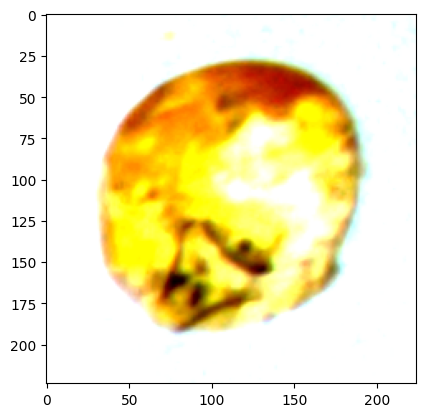

In [5]:
class CornDataset(Dataset):
    def __init__(self, root_dir, df, is_test, is_valid, ltoi,
                 transform: dict[str, A.Compose | None]):
        self.root_dir = root_dir
        self.df = df
        self.transform = transform
        self.ltoi = ltoi
        self.is_test = is_test
        self.is_valid = is_valid

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        data_row = self.df.iloc[idx]
        image_path = f"{self.root_dir}/{data_row['image']}"
        image = Image.open(image_path).convert('RGB')
        image = np.array(image)
        
        if self.is_test:
            augmented = self.transform['test']
            image = augmented['image']
            return image, data_row['test_id']
        else:
            augmented = self.transform[
                'valid' if self.is_valid else 'train'](image=image)
            image = augmented['image']
            label = self.ltoi[data_row['label']]
            return image, label

def collate_fn(batch):
    images, labels = zip(*batch)
    images = torch.stack(images, dim=0)
    labels = torch.tensor(labels)
    return images, labels

def save_indices(filename, dataset):
    with open(filename, 'wb') as f:
        pickle.dump(dataset.indices, f)

def load_dataset(filename, base_dataset):
    with open(filename, 'rb') as f:
        indices = pickle.load(f)
    return Subset(base_dataset, indices)

train_df = pd.read_csv(paths['train_csv'])

print(train_df)

print(train_df.label.unique())

print(train_df.groupby(['label']).size())

corn_ds = CornDataset(paths['corn_root'], train_df, 
                      is_test = False, 
                      is_valid = True, 
                      ltoi=ltoi, 
                      transform={
                          'train': train_tfms,
                          'valid': valid_tfms,
                          'test': valid_tfms
                          })

print(f"{len(corn_ds)=}")

image, label = corn_ds[0]
show_image(image)
print(f"{label=}")

# Split the dataset into train and validation sets
# train_pc = 0.8
# train_size = int(train_pc * len(corn_ds))
# val_size = len(corn_ds) - train_size
# train_dataset, val_dataset = random_split(corn_ds, [train_size, val_size], generator=gen)

# with open('train_dataset.indices.pkl', 'wb') as f:
#     pickle.dump(train_dataset.indices, f)
# with open('val_dataset.indices.pkl', 'wb') as f:
#     pickle.dump(val_dataset.indices, f)


# # Save indices
# save_indices('train_dataset.indices.pkl', train_dataset)
# save_indices('val_dataset.indices.pkl', val_dataset)

# Load datasets
val_dataset = load_dataset('val_dataset.indices.pkl', corn_ds)
train_dataset = load_dataset('train_dataset.indices.pkl', corn_ds)

print(f"{len(train_dataset)=}\n{len(val_dataset)=}")

In [7]:
train_df[train_df['label']=='broken'].head()

,seed_id,view,image,label
0,0,top,train/00000.png,broken
2,3,top,train/00003.png,broken
7,8,bottom,train/00008.png,broken
9,10,bottom,train/00010.png,broken
10,12,bottom,train/00012.png,broken


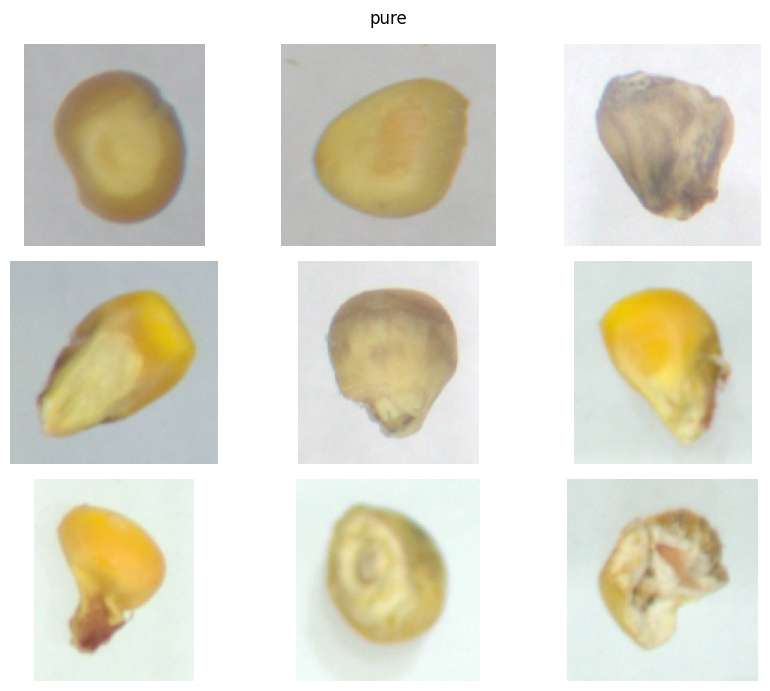

In [14]:
plot_images_sample(train_df, 'pure', paths, 9, 3)

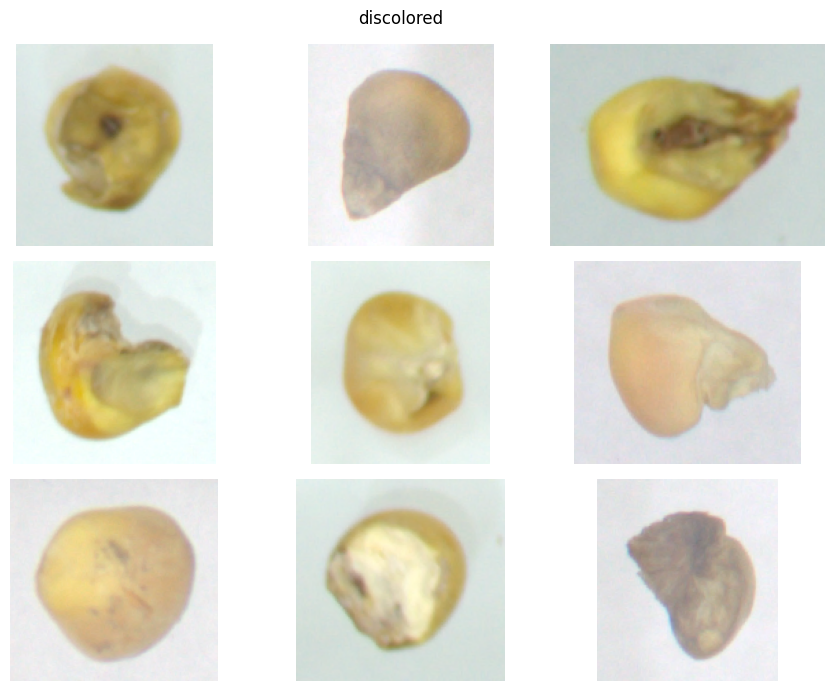

In [15]:
plot_images_sample(train_df, 'discolored', paths, 9, 3)

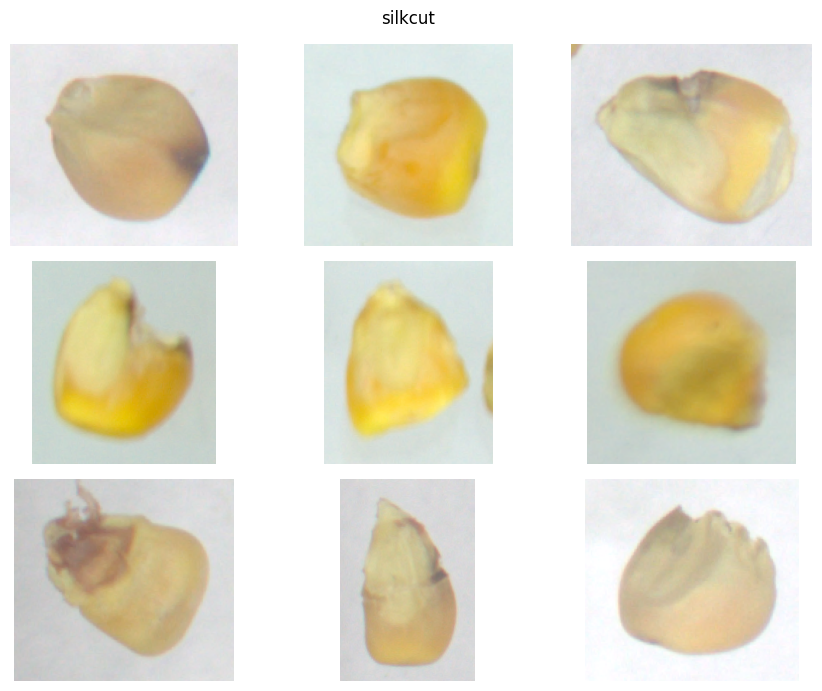

In [16]:
plot_images_sample(train_df, 'silkcut', paths, 9, 3)

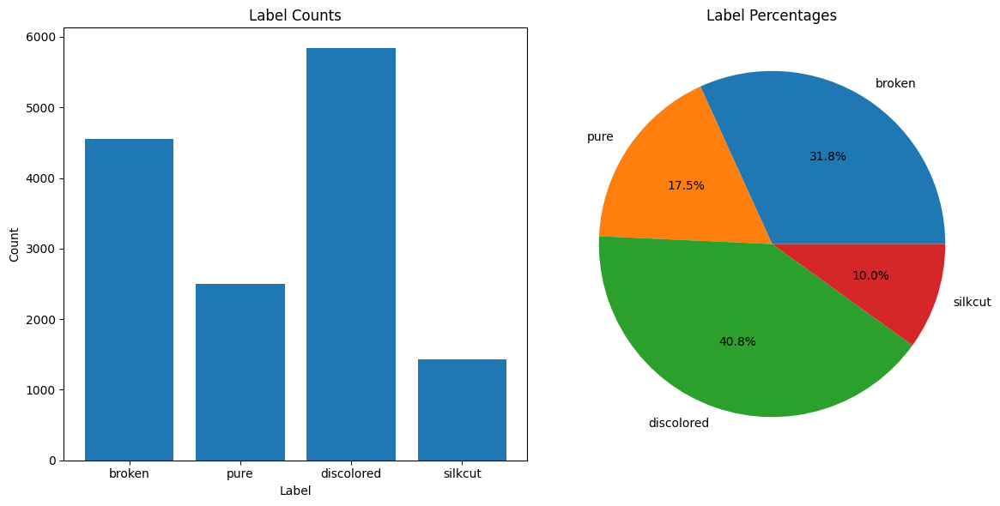

In [19]:
# Plot data
plot_data(train_df, 'label', ltoi)


## Model Definition

In [41]:
class LuongAttention(nn.Module):
    def __init__(self, hidden_size):
        super(LuongAttention, self).__init__()
        self.hidden_size = hidden_size

    def forward(self, query, keys):
        scores = torch.bmm(query, keys.transpose(1, 2))
        scores /= math.sqrt(self.hidden_size)

        weights = F.softmax(scores, dim=-1)
        context = torch.bmm(weights, keys)

        return context, weights

    def dot_score(self, query, keys):
        # Dot product between query and keys
        scores = torch.bmm(query, keys.transpose(1, 2))
        return scores / math.sqrt(self.hidden_size)

class EncoderCNN(nn.Module):
    def __init__(self, retrain=False):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        modules = list(resnet.children())[:-3]      # Remove [Sequential: 2-8][AdaptiveAvgPool2d: 2-9][FC]
        self.resnet = nn.Sequential(*modules)       # Unpack and make it the conv_net        
        self.retrain = retrain
        self.toggle_train(retrain)
                
    def forward(self, images):
        # images.shape (batch_size, 3, 224, 224)
        batch_size = images.shape[0]
        
        if self.retrain:
            features = self.resnet(images)      # Shape : (batch_size, 1024, 14, 14)
        else:
            with torch.no_grad():
                features = self.resnet(images)
        
        # (batch_size, L=14*14 = 196, 1024) 
        features = features.reshape(batch_size, 1024, -1).permute(0, 2, 1)
        
        return features
    
    def toggle_train(self, do_train=False):
        if do_train:
            print("Unfreezing all weights")
        else:
            print("Freezing all weights")
        for param in self.resnet.parameters():
            param.requires_grad = do_train
        
        self.retrain = do_train
        print(f"{self.retrain=}")

class EncoderViT(nn.Module):
    def __init__(self, model_name='vit_base_patch16_224', 
                 pretrained=True, retrain=False):
        super(EncoderViT, self).__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        self.retrain = retrain
        self.toggle_train(retrain)

    def forward(self, images):
        if self.retrain:
            features = self.model.forward_features(images)
        else:
            with torch.no_grad():
                features = self.model.forward_features(images)
            
        return features
    
    def toggle_train(self, do_train=False):
        if do_train:
            print("Unfreezing all weights")
        else:
            print("Freezing all weights")
        for param in self.model.parameters():
            param.requires_grad = do_train
        
        self.retrain = do_train
        print(f"{self.retrain=}")
    

class ClassificationHead(nn.Module):
    def __init__(self, encoder_dim, num_classes,
                 is_vit=False, cnn_feature_len=196):
        super(ClassificationHead, self).__init__()
        self.is_vit = is_vit
        if is_vit:  
            self.encoder_dim = encoder_dim
            print("Expect vit_base_patch16_224 encoder.")
        else:
            print("Expect ResNet50 encoder.")
            self.encoder_dim = encoder_dim * cnn_feature_len
        print(f"{self.encoder_dim=}")
        self.fc = nn.Linear(self.encoder_dim, num_classes)
        self.dropout = nn.Dropout(0.5)
        self.bn = nn.BatchNorm1d(num_classes)

    def forward(self, features):
        batch_size, _, _ = features.shape
        if self.is_vit:
            # Get the CLS token
            features = features[:, 0, :]
        else:
            features = features.reshape(batch_size, -1)
        scores = self.fc(features)
        scores = self.bn(scores)
        return scores

class ImageClassifier(nn.Module):
    def __init__(self, encoder, encoder_dim, num_classes,
                 return_attn_weight=False, do_attn=True, is_vit=False):
        super(ImageClassifier, self).__init__()
        self.encoder = encoder
        self.do_attn = do_attn
        self.return_attn_weight = return_attn_weight
        if do_attn:
            print("Use Luong Attention-Dot mode")
            self.attention = LuongAttention(encoder_dim)
            
        self.toggle_return_attn_weight(return_attn_weight)
            
        self.classifier = ClassificationHead(encoder_dim, num_classes, is_vit)

    def forward(self, images):
        features = self.encoder(images)
        if self.do_attn:
            # Apply attention mechanism
            context, weights = self.attention(features, features)
            scores = self.classifier(context)
            if self.return_attn_weight:
                return scores, weights
        else:
            scores = self.classifier(features)
        return scores
    
    def toggle_return_attn_weight(self, do_return=False):
        self.return_attn_weight = do_return and self.do_attn
        res_str = 'Will' if self.return_attn_weight else 'Won\'t'
        print(f"{res_str} return Attn weight")
        


def train(num_epochs, model, criterion, optimizer, train_loader, 
          plot=True, plot_every=100, losses=None):
    if not losses:
        losses = []
    model.train()
    
    total_train = len(train_loader)
    for epoch in range(num_epochs):
        total_loss = 0
        for i, (images, labels) in tqdm.tqdm(enumerate(train_loader), total=total_train):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            losses.append(loss.item())
            
            if plot and i % plot_every == 0:
                plot_training(losses)
                print(f"[{i}/{total_train}] Loss: {loss.item()}")
                    
        print(f"Epoch: {epoch+1}, Loss: {total_loss/total_train}")
        
    return losses


def val(val_loader, model):
    total_correct = 0
    total_labels = 0
    total_val = len(val_loader)
    model.eval()
    all_preds = []
    all_labels = []
    for i, (images, labels) in tqdm.tqdm(enumerate(val_loader), total=total_val):
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad():
            output = model(images)
        preds = torch.argmax(output, dim=1)
        
        correct = (preds == labels).sum().item()
        total_correct += correct
        total_labels += labels.size(0)

        # Store all predictions and labels for confusion matrix
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Compute accuracy
    accuracy = total_correct / total_labels

    # Compute confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)

    return accuracy, conf_matrix

def save_model(model_name, model, losses, curr_epoch):
    torch.save({
        'model_state_dict': model.state_dict(),
        'losses': losses,
        'curr_epoch': curr_epoch,
    }, f"{model_name}_{curr_epoch}.pth")
    
def load_model(path, do_attn, is_vit, num_classes):
    encoder_dim = 768 if is_vit else 1024
    if is_vit:
        # encoder_dim = 768 
        encoder = EncoderViT()    
    else:
        # encoder_dim = 1024
        encoder = EncoderCNN() 
        
    model = ImageClassifier(
        encoder=encoder,
        encoder_dim=encoder_dim,
        num_classes=num_classes,
        do_attn=do_attn,
        is_vit=is_vit
    )
    check_point = torch.load(path, map_location=device)
    losses =        check_point['losses']
    curr_epoch =    check_point['curr_epoch']
    print(model.load_state_dict(check_point['model_state_dict']))
    
    print(f"Load {path} successfully")
    
    return losses, curr_epoch, model


## Model architecture

### CNN ResNet + Luong Attn

In [42]:
num_classes = len(ltoi)

losses_cnn, curr_epoch_cnn, model_cnn = load_model(
   'CornCNN_Attn_20.pth',
   do_attn=True, is_vit=False, num_classes=num_classes 
)

model_cnn = model_cnn.to(device)

criterion_cnn = nn.CrossEntropyLoss()
optimizer_cnn = torch.optim.Adam(model_cnn.parameters(), lr=0.001)

Freezing all weights
self.retrain=False
Use Luong Attention-Dot mode
Won't return Attn weight
Expect ResNet50 encoder.
self.encoder_dim=200704
<All keys matched successfully>
Load CornCNN_Attn_20.pth successfully


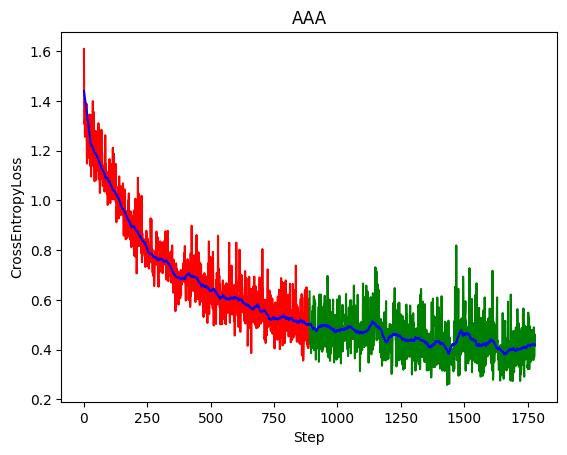

In [5]:
smooth = plot_losses_smooth(losses_cnn, "AAA")

In [44]:
num_classes = len(ltoi)

losses_cnn_10, curr_epoch_cnn_10, model_cnn_10 = load_model(
   'CornCNN_Attn_10.pth',
   do_attn=True, is_vit=False, num_classes=num_classes 
)

model_cnn_10 = model_cnn_10.to(device)

criterion_cnn_10 = nn.CrossEntropyLoss()
optimizer_cnn_10 = torch.optim.Adam(model_cnn_10.parameters(), lr=0.001)

Freezing all weights
self.retrain=False
Use Luong Attention-Dot mode
Won't return Attn weight
Expect ResNet50 encoder.
self.encoder_dim=200704
<All keys matched successfully>
Load CornCNN_Attn_10.pth successfully


In [45]:
summary(model_cnn, input_size=(32, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
ImageClassifier                                    [32, 4]                   --
├─EncoderCNN: 1-1                                  [32, 196, 1024]           --
│    └─Sequential: 2-1                             [32, 1024, 14, 14]        --
│    │    └─Conv2d: 3-1                            [32, 64, 112, 112]        (9,408)
│    │    └─BatchNorm2d: 3-2                       [32, 64, 112, 112]        (128)
│    │    └─ReLU: 3-3                              [32, 64, 112, 112]        --
│    │    └─MaxPool2d: 3-4                         [32, 64, 56, 56]          --
│    │    └─Sequential: 3-5                        [32, 256, 56, 56]         (215,808)
│    │    └─Sequential: 3-6                        [32, 512, 28, 28]         (1,219,584)
│    │    └─Sequential: 3-7                        [32, 1024, 14, 14]        (7,098,368)
├─LuongAttention: 1-2                              [32, 196, 1024]           --
├─

### ViT

In [47]:
num_classes = len(ltoi)

losses_vit, curr_epoch_vit, model_vit = load_model(
   'CornViT_20.pth',
   do_attn=False, is_vit=True, num_classes=num_classes 
)

model_vit = model_vit.to(device)

criterion_vit = nn.CrossEntropyLoss()
optimizer_vit = torch.optim.Adam(model_vit.parameters(), lr=0.001)

Freezing all weights
self.retrain=False
Won't return Attn weight
Expect vit_base_patch16_224 encoder.
self.encoder_dim=768
<All keys matched successfully>
Load CornViT_20.pth successfully


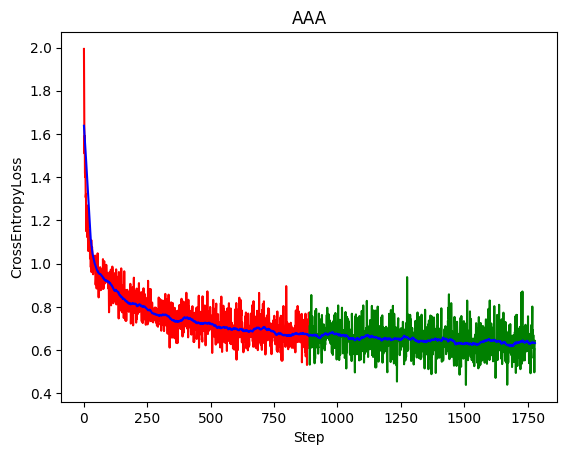

In [48]:
smooth = plot_losses_smooth(losses_vit, "AAA")

In [50]:
num_classes = len(ltoi)

losses_vit_10, curr_epoch_vit_10, model_vit_10 = load_model(
   'CornViT_10.pth',
   do_attn=False, is_vit=True, num_classes=num_classes 
)

model_vit_10 = model_vit_10.to(device)

criterion_vit_10 = nn.CrossEntropyLoss()
optimizer_vit_10 = torch.optim.Adam(model_vit_10.parameters(), lr=0.001)

Freezing all weights
self.retrain=False
Won't return Attn weight
Expect vit_base_patch16_224 encoder.
self.encoder_dim=768
<All keys matched successfully>
Load CornViT_10.pth successfully


In [49]:
summary(model_vit, input_size=(32, 3, 224, 224))

e:\ProgramData\anaconda3\envs\cute\lib\site-packages\timm\models\vision_transformer.py:91: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  x = F.scaled_dot_product_attention(


Layer (type:depth-idx)                             Output Shape              Param #
ImageClassifier                                    [32, 4]                   --
├─EncoderViT: 1-1                                  [32, 197, 768]            --
│    └─VisionTransformer: 2-1                      --                        921,064
│    │    └─PatchEmbed: 3-1                        [32, 196, 768]            (590,592)
│    │    └─Dropout: 3-2                           [32, 197, 768]            --
│    │    └─Identity: 3-3                          [32, 197, 768]            --
│    │    └─Identity: 3-4                          [32, 197, 768]            --
│    │    └─Sequential: 3-5                        [32, 197, 768]            (85,054,464)
│    │    └─LayerNorm: 3-6                         [32, 197, 768]            (1,536)
├─ClassificationHead: 1-2                          [32, 4]                   --
│    └─Linear: 2-2                                 [32, 4]                   3,076
│    

## Model training

In [56]:
# Create data loaders
batch_size = 128
num_workers = 8

train_loader = DataLoader(train_dataset, batch_size=batch_size, 
                          shuffle=True, collate_fn=collate_fn, drop_last=True)

val_loader = DataLoader(val_dataset, batch_size=batch_size, 
                        shuffle=False, collate_fn=collate_fn, drop_last=False)

### CNN-Attn 

In [ ]:
# Train 10 epochs with ResNet50 Frozen
num_epochs = 10

losses = train(
    num_epochs, model_cnn, criterion_cnn, optimizer_cnn, 
    train_loader, True, 5, losses_cnn)

curr_epoch_cnn += num_epochs

In [ ]:
# Train 10 epochs with ResNet50 Unfrozen
model_cnn.encoder.toggle_train(True)

num_epochs = 10

losses = train(
    num_epochs, model_cnn, criterion_cnn, optimizer_cnn, 
    train_loader, True, 5, losses_cnn)

curr_epoch_cnn += num_epochs

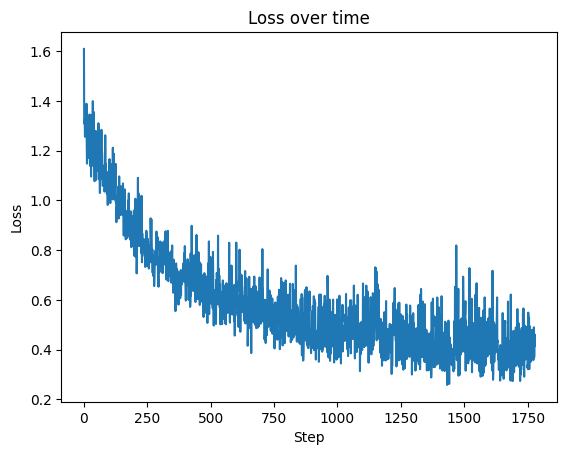

In [17]:
plot_training(losses_cnn)

### ViT

In [ ]:
# Train 20 epochs with Vit Base 16 224 Frozen
num_epochs = 20

losses_vit = train(
    num_epochs, model_vit, criterion_vit, optimizer_vit, 
    train_loader, True, 5, losses_vit)

curr_epoch_vit += num_epochs

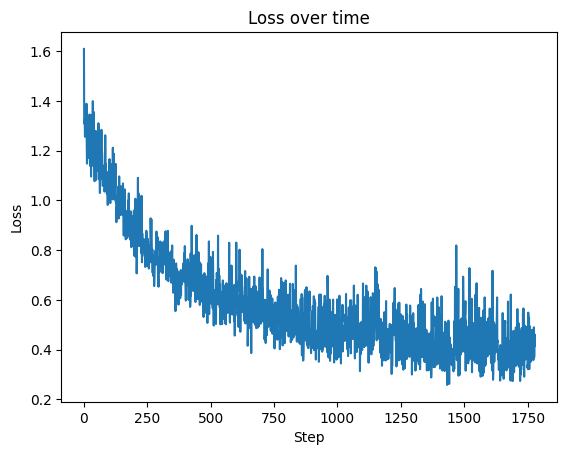

In [133]:
plot_training(losses_vit)

## Model evaluation

### Losses: CNN-Attn vs ViT

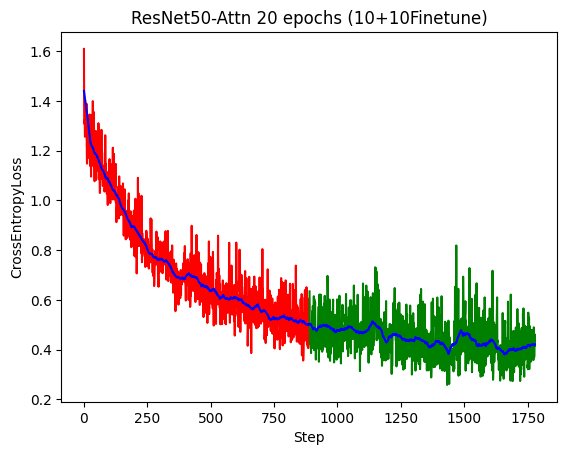

In [52]:
plot_losses_smooth(losses_cnn, "ResNet50-Attn 20 epochs (10+10Finetune)")

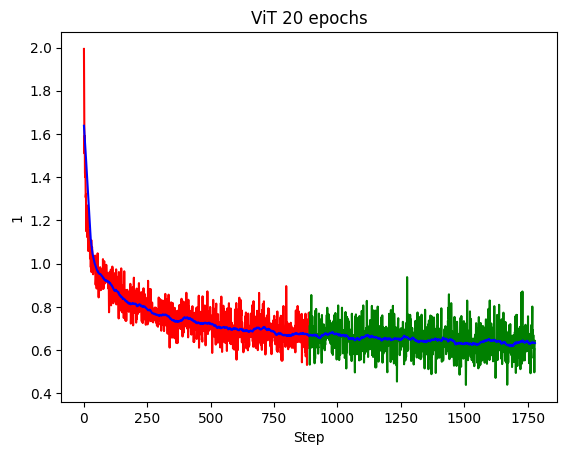

In [53]:
plot_losses_smooth(losses_vit, "ViT 20 epochs", 1)

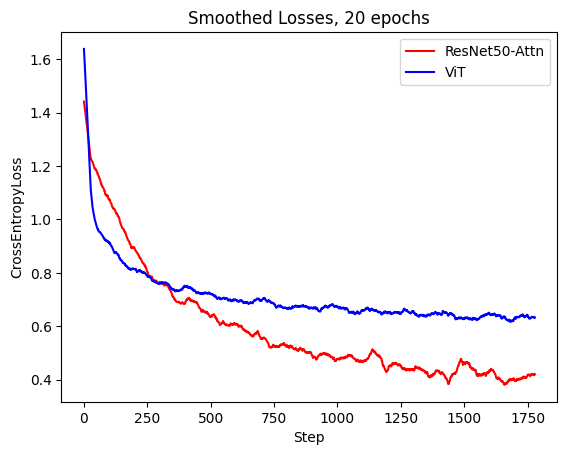

In [54]:
plot_multi_losses_smooth(losses_cnn, losses_vit, 
                         "Smoothed Losses, 20 epochs", "ResNet50-Attn", "ViT")

### Accuracies and Confusion matrices: CNN-Attn vs ViT (10, 20 epochs)

In [38]:
accuracy_cnn_20, conf_matrix_cnn_20 = val(val_loader, model_cnn)
print(f"Accuracy: {accuracy_cnn_20}")
print(conf_matrix_cnn_20)

100%|██████████| 23/23 [00:13<00:00,  1.75it/s]

Accuracy: 0.7068062827225131
[[ 601  182   63   37]
 [ 133 1022   18   22]
 [ 138   87  208   48]
 [  43   56   13  194]]


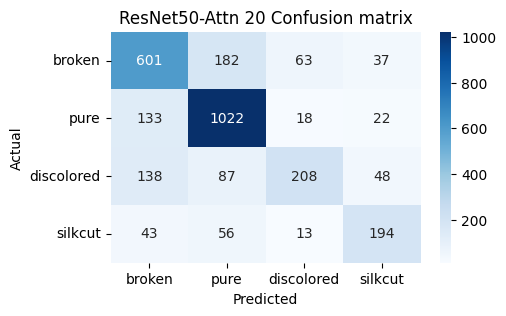

[[0.6806342  0.20611552 0.07134768 0.0419026 ]
 [0.11129707 0.85523013 0.01506276 0.01841004]
 [0.28690229 0.18087318 0.43243243 0.0997921 ]
 [0.14052288 0.18300654 0.04248366 0.63398693]]


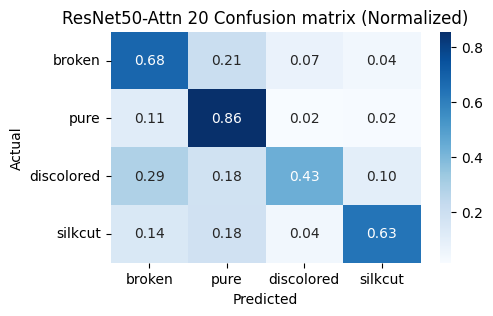

In [60]:
confuse_plot(conf_matrix_cnn_20, "ResNet50-Attn 20 Confusion matrix", itol)
plot_normalized_confusion_matrix(conf_matrix_cnn_20, "ResNet50-Attn 20 Confusion matrix (Normalized)")

100%|██████████| 23/23 [00:12<00:00,  1.92it/s]


Accuracy: 0.71239092495637
[[645 135  72  31]
 [192 934  54  15]
 [127  49 281  24]
 [ 51  48  26 181]]


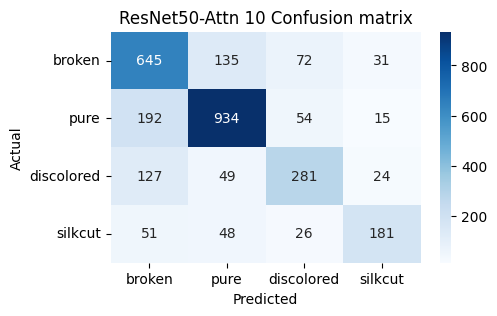

[[0.73046433 0.15288788 0.0815402  0.03510759]
 [0.16066946 0.78158996 0.04518828 0.0125523 ]
 [0.26403326 0.1018711  0.58419958 0.04989605]
 [0.16666667 0.15686275 0.08496732 0.59150327]]


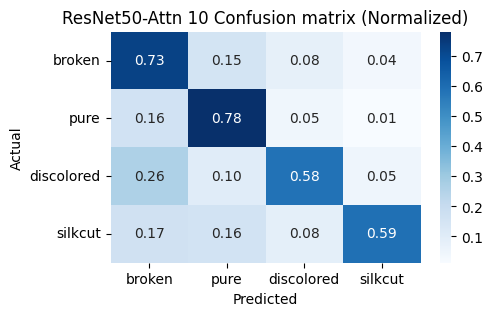

In [62]:
accuracy_cnn_10, conf_matrix_cnn_10 = val(val_loader, model_cnn_10)
print(f"Accuracy: {accuracy_cnn_10}")
print(conf_matrix_cnn_10)
confuse_plot(conf_matrix_cnn_10, "ResNet50-Attn 10 Confusion matrix", itol)
plot_normalized_confusion_matrix(conf_matrix_cnn_10, "ResNet50-Attn 10 Confusion matrix (Normalized)")

100%|██████████| 23/23 [00:28<00:00,  1.25s/it]


Accuracy: 0.7211169284467713
[[ 574  220   53   36]
 [  90 1060   36    9]
 [  99  109  244   29]
 [  33   61   24  188]]


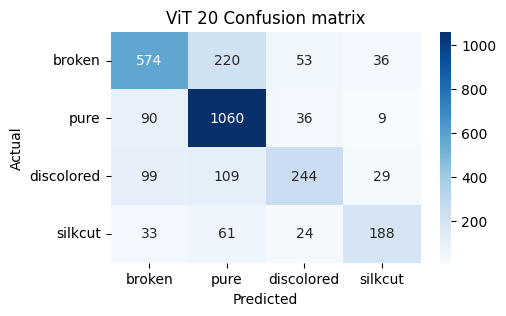

[[0.65005663 0.24915062 0.06002265 0.0407701 ]
 [0.07531381 0.88702929 0.03012552 0.00753138]
 [0.20582121 0.22661123 0.50727651 0.06029106]
 [0.10784314 0.19934641 0.07843137 0.61437908]]


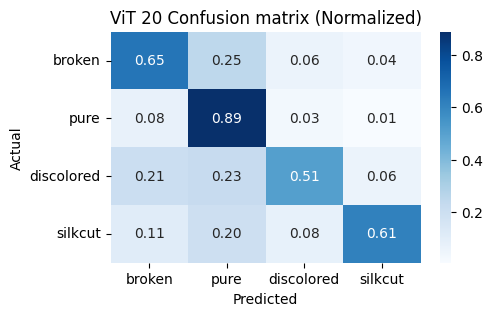

In [63]:
accuracy_vit_20, conf_matrix_vit_20 = val(val_loader, model_vit)
print(f"Accuracy: {accuracy_vit_20}")
print(conf_matrix_vit_20)
confuse_plot(conf_matrix_vit_20, "ViT 20 Confusion matrix", itol)
plot_normalized_confusion_matrix(conf_matrix_vit_20, "ViT 20 Confusion matrix (Normalized)")

100%|██████████| 23/23 [00:29<00:00,  1.27s/it]


Accuracy: 0.7190226876090751
[[630 158  65  30]
 [144 994  37  20]
 [124  81 244  32]
 [ 51  38  25 192]]


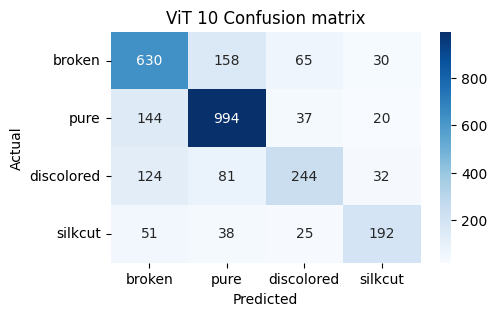

[[0.71347678 0.17893545 0.07361268 0.03397508]
 [0.12050209 0.83179916 0.03096234 0.0167364 ]
 [0.25779626 0.16839917 0.50727651 0.06652807]
 [0.16666667 0.12418301 0.08169935 0.62745098]]


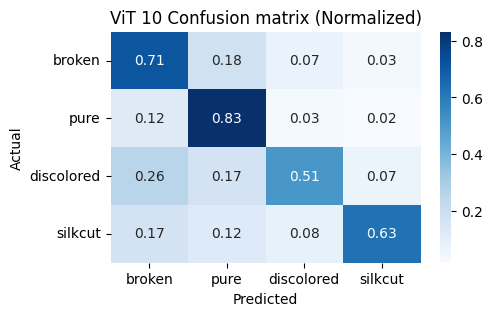

In [64]:
accuracy_vit_10, conf_matrix_vit_10 = val(val_loader, model_vit_10)
print(f"Accuracy: {accuracy_vit_10}")
print(conf_matrix_vit_10)
confuse_plot(conf_matrix_vit_10, "ViT 10 Confusion matrix", itol)
plot_normalized_confusion_matrix(conf_matrix_vit_10, "ViT 10 Confusion matrix (Normalized)")

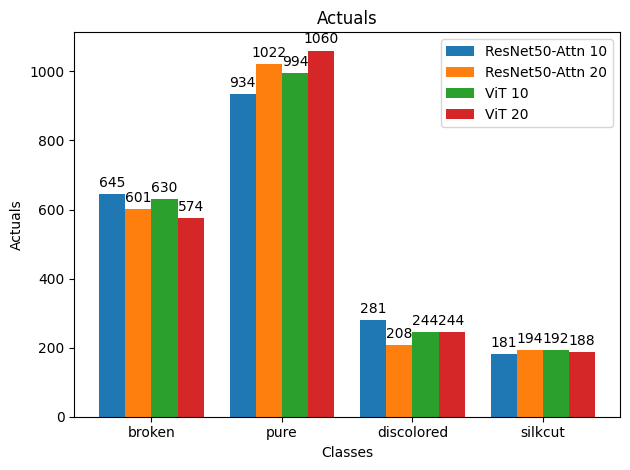

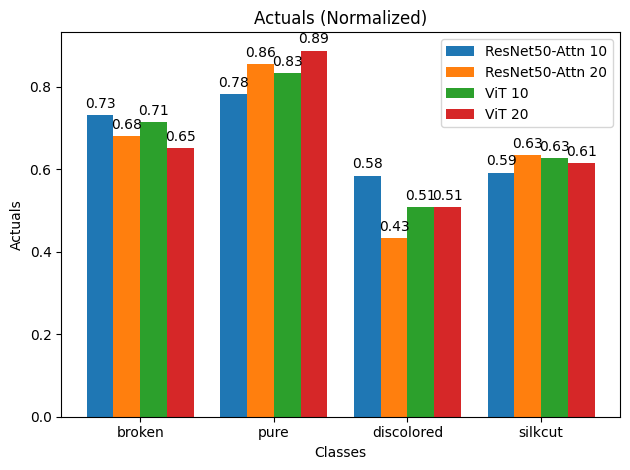

In [74]:

confs = [
    conf_matrix_cnn_10,
    conf_matrix_cnn_20,
    conf_matrix_vit_10,
    conf_matrix_vit_20,
]  
names = [
    'ResNet50-Attn 10',
    'ResNet50-Attn 20',
    'ViT 10',
    'ViT 20',    
]

norm_confs = [
    normalize_confusion_matrix(conf_matrix_cnn_10),
    normalize_confusion_matrix(conf_matrix_cnn_20),
    normalize_confusion_matrix(conf_matrix_vit_10),
    normalize_confusion_matrix(conf_matrix_vit_20),
]

plot_actuals(confs, names, ltoi, 'Actuals', False)

plot_actuals(norm_confs, names, ltoi, 'Actuals (Normalized)', True)

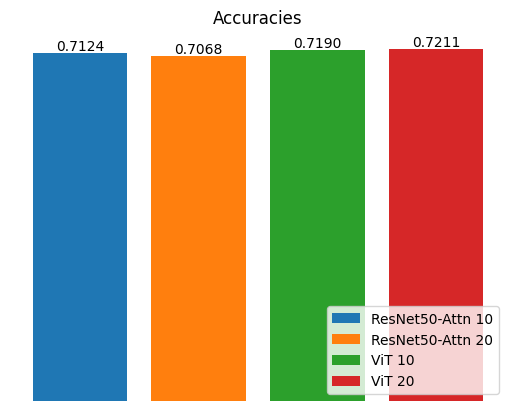

In [71]:
accuracies = [
    accuracy_cnn_10,
    accuracy_cnn_20,
    accuracy_vit_10,
    accuracy_vit_20
]

colors = ['r', 'g', 'b', 'y', 'm', 'c']
labels = ['ResNet50-Attn 10',
          'ResNet50-Attn 20',
          'ViT 10',
          'ViT 20',]

plot_accuracies(accuracies, colors, labels)

### Exploration

#### ResNet50 Feature maps

silkcut
torch.Size([64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 128, 112, 112])
torch.Size([1, 256, 56, 56])


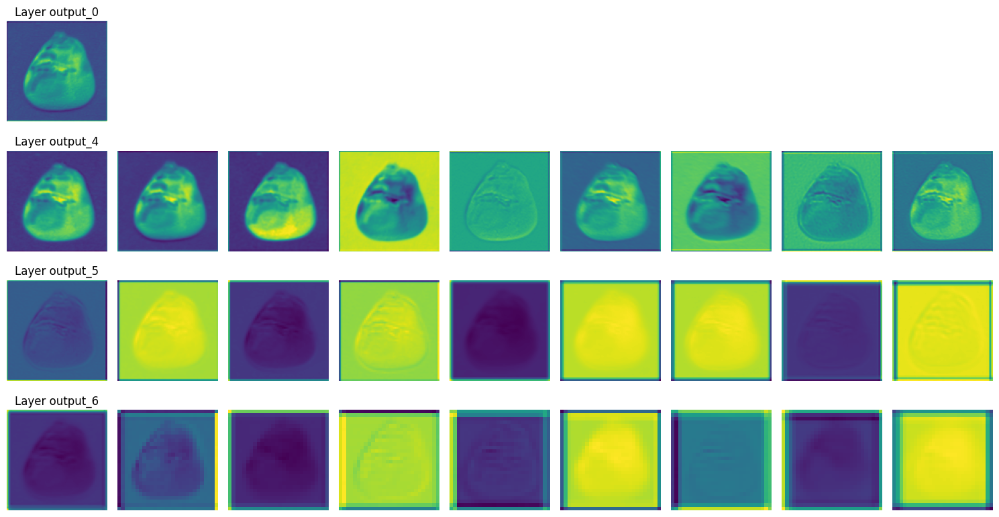

In [78]:
resnet_childrens = list(model_cnn.encoder.resnet.children())

image, label = val_dataset[335]
print(f"{itol[label]}")

image_tensor = image.unsqueeze(0).to(device)

output_0, outputs = get_conv_feature_maps(resnet_childrens, image_tensor)

print(output_0[0].shape)

print(outputs[4][0].shape)
print(outputs[5][0].shape)
print(outputs[6][0].shape)

# Prepare the layers' outputs for plotting
layers_to_plot = {
    'output_0': [output_0],
    'output_4': outputs[4],
    'output_5': outputs[5],
    'output_6': outputs[6]
}

# Plot the feature maps
plot_feature_maps_meaned(layers_to_plot)

# for i in [6]:
#     for j, output in enumerate(outputs[i]):
#         plot_layer_feature_maps(output, f'layer_{i}_output_{j+1}_conv{(j % 3)+1}')

torch.Size([64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 128, 112, 112])
torch.Size([1, 256, 56, 56])


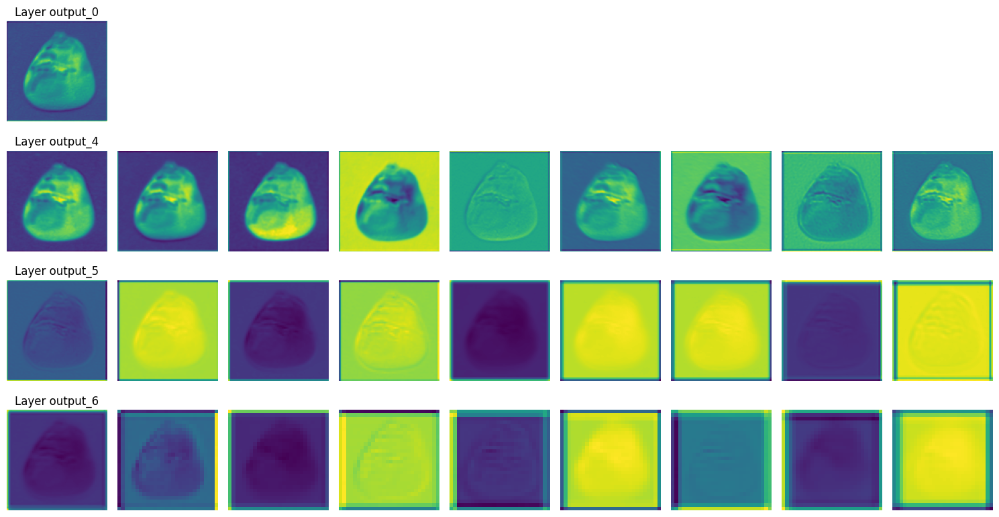

In [80]:
resnet_childrens_10 = list(model_cnn_10.encoder.resnet.children())

output_0_10, outputs_10 = get_conv_feature_maps(resnet_childrens, image_tensor)

print(output_0[0].shape)

print(outputs_10[4][0].shape)
print(outputs_10[5][0].shape)
print(outputs_10[6][0].shape)
k = 10

layers_to_plot = {
    'output_0': [output_0_10],
    'output_4': outputs_10[4],
    'output_5': outputs_10[5],
    'output_6': outputs_10[6]
}

# Plot the feature maps
plot_feature_maps_meaned(layers_to_plot)

# for i in [4]:
#     for j, output in enumerate(outputs_10[i]):
#         plot_layer_feature_maps(output, f'layer_{i}_output_{j+1}_conv{(j % 3)+1}')

#### ResNet50 Luong Attn Activation map

Unfreezing all weights
self.retrain=True
Will return Attn weight
Unfreezing all weights
self.retrain=True
Will return Attn weight
silkcut


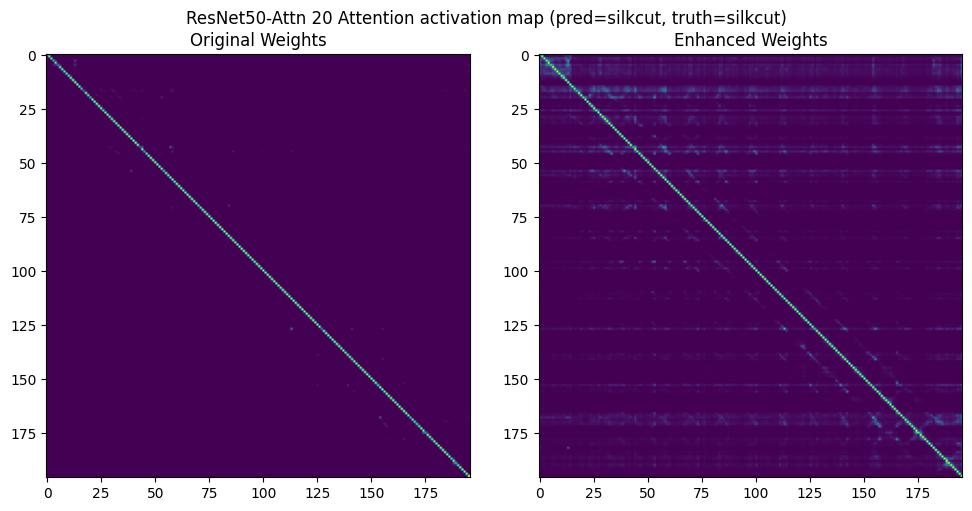

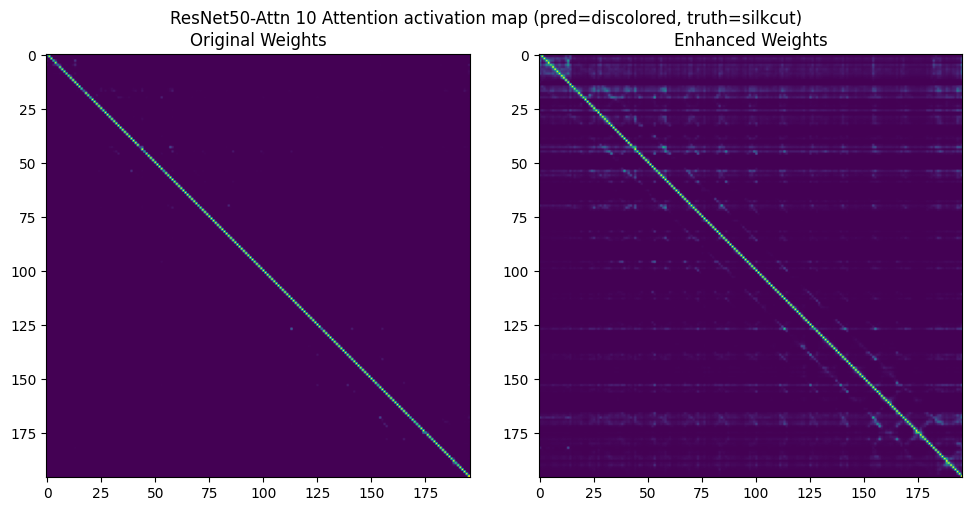

In [100]:
model_cnn.encoder.toggle_train(True)
model_cnn.encoder.retrain = True
model_cnn.toggle_return_attn_weight(True)

model_cnn_10.encoder.toggle_train(True)
model_cnn_10.encoder.retrain = True
model_cnn_10.toggle_return_attn_weight(True)

image, label = val_dataset[335]
print(f"{itol[label]}")

image_tensor = image.unsqueeze(0).to(device)

plot_attn_map(image_tensor, label, model_cnn, "ResNet50-Attn 20")
plot_attn_map(image_tensor, label, model_cnn_10, "ResNet50-Attn 10")

#### ResNet50 GRADCAM

In [132]:
class InfoHolder():
    def __init__(self, heatmap_layer):
        self.gradient = None
        self.activation = None
        self.heatmap_layer = heatmap_layer

    def get_gradient(self, grad):
        self.gradient = grad

    def hook(self, model, input, output):
        output.register_hook(self.get_gradient)
        self.activation = output.detach()
        
def generate_heatmap(weighted_activation):
    raw_heatmap = torch.mean(weighted_activation, 0)
    heatmap = np.maximum(raw_heatmap.detach().cpu(), 0)
    heatmap /= torch.max(heatmap) + 1e-10
    return heatmap.numpy()

def superimpose(input_img, heatmap):
    img = cv2.cvtColor(input_img,cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[0], img.shape[1]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = np.uint8(heatmap * 0.6 + img * 0.4)
    pil_img = cv2.cvtColor(superimposed_img,cv2.COLOR_BGR2RGB)
    return pil_img

def to_RGB(tensor):
    tensor = (tensor - tensor.min())
    tensor = tensor/(tensor.max() + 1e-10)
    image_binary = np.transpose(tensor.numpy(), (1, 2, 0))
    image = np.uint8(255 * image_binary)
    return image

def process_model_out(model, model_out):
    if model.return_attn_weight:
        output, _ = model_out
    else:
        output = model_out
    
    return output[0]

def grad_cam(model, input_tensor, heatmap_layer, truelabel=None):
    info = InfoHolder(heatmap_layer)
    heatmap_layer.register_forward_hook(info.hook)
    
    model_out = model(input_tensor)
    output = process_model_out(model, model_out)
    truelabel = truelabel if truelabel else torch.argmax(output)

    output[truelabel].backward()
    print(info.gradient.shape)
    weights = torch.mean(info.gradient, [0, 2, 3])
    activation = info.activation.squeeze(0)

    weighted_activation = torch.zeros(activation.shape)
    for idx, (weight, activation) in enumerate(zip(weights, activation)):
        weighted_activation[idx] = weight * activation

    heatmap = generate_heatmap(weighted_activation)
    input_image = to_RGB(input_tensor.squeeze().cpu())

    return superimpose(input_image, heatmap)

def plot_heatmap_grid(model, input_tensor, heatmap_layer, truth, model_name):
    info = InfoHolder(heatmap_layer)
    heatmap_layer.register_forward_hook(info.hook)
    
    model_out = model(input_tensor)
    output = process_model_out(model, model_out)
    
    pred = torch.argmax(output).item()
    
    num_classes = 4  # Assuming there are 4 classes
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    for class_idx in range(num_classes):
        heatmap = grad_cam(model, input_tensor, heatmap_layer, truelabel=class_idx)
        axs[class_idx // 2, class_idx % 2].imshow(heatmap)
        axs[class_idx // 2, class_idx % 2].set_title(f"{itol[class_idx]}")

    plt.suptitle(f"{model_name} Activation map.\nGround truth: {itol[truth]}.Predict: {itol[pred]}")
    plt.tight_layout()
    plt.show()

def plot_heatmap_grid_dual(model_A, model_B, input_tensor, heatmap_layer_A, heatmap_layer_B, truth, model_name_A, model_name_B):
    info_A = InfoHolder(heatmap_layer_A)
    heatmap_layer_A.register_forward_hook(info_A.hook)
    
    info_B = InfoHolder(heatmap_layer_B)
    heatmap_layer_B.register_forward_hook(info_B.hook)
    
    model_out_A = model_A(input_tensor)
    output_A = process_model_out(model_A, model_out_A)
    model_out_B = model_B(input_tensor)
    output_B = process_model_out(model_B, model_out_B)
    
    print(output_A)
    print(output_B)
    
    pred_A = torch.argmax(output_A).item()
    pred_B = torch.argmax(output_B).item()
    
    num_classes = 4  # Assuming there are 4 classes
    fig, axs = plt.subplots(2, num_classes, figsize=(20, 10))  # Adjust the size as needed

    for class_idx in range(num_classes):
        # Model A
        heatmap_A = grad_cam(model_A, input_tensor, heatmap_layer_A, truelabel=class_idx)
        axs[0, class_idx].imshow(heatmap_A)
        axs[0, class_idx].set_title(f"{model_name_A}\nToward: {itol[class_idx]} - Truth: {itol[truth]} - Pred: {itol[pred_A]}")
        axs[0, class_idx].axis('off')

        # Model B
        heatmap_B = grad_cam(model_B, input_tensor, heatmap_layer_B, truelabel=class_idx)
        axs[1, class_idx].imshow(heatmap_B)
        axs[1, class_idx].set_title(f"{model_name_B}\nToward: {itol[class_idx]} - Truth: {itol[truth]} - Pred: {itol[pred_B]}")
        axs[1, class_idx].axis('off')
    
    plt.tight_layout()
    plt.show()


In [139]:
image, label = val_dataset[335]
print(f"{itol[label]}")

image, label = val_dataset[2]
print(f"{itol[label]}")

image, label = val_dataset[227]
print(f"{itol[label]}")

image, label = val_dataset[0]
print(f"{itol[label]}")

silkcut
pure
discolored
broken


torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])


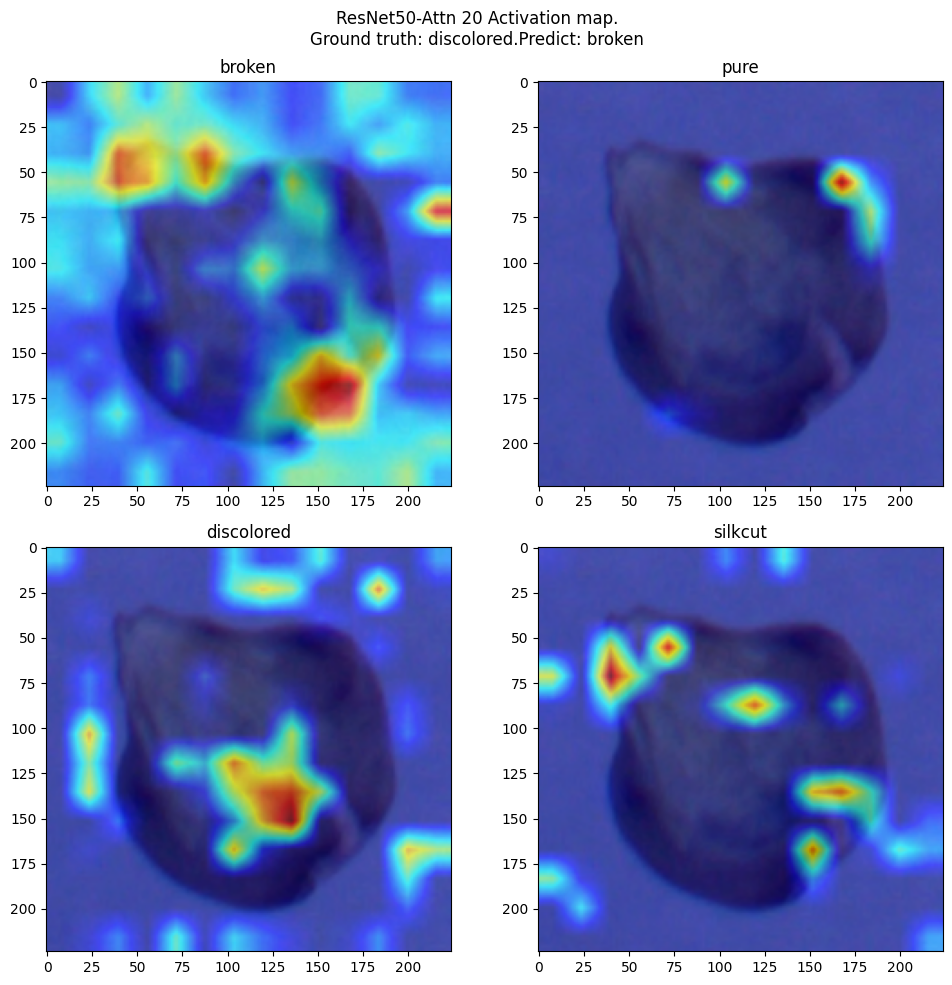

In [131]:
heatmap_layer = model_cnn.encoder.resnet[6]
image, label = val_dataset[227]
image_tensor = image.unsqueeze(0).to(device)

plot_heatmap_grid(model_cnn, image_tensor, heatmap_layer, label, "ResNet50-Attn 20")

discolored
tensor([ 0.7159, -0.0591, -0.0896, -0.9850], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([ 0.5819, -0.0548,  0.0341, -1.5741], device='cuda:0',
       grad_fn=<SelectBackward0>)
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])


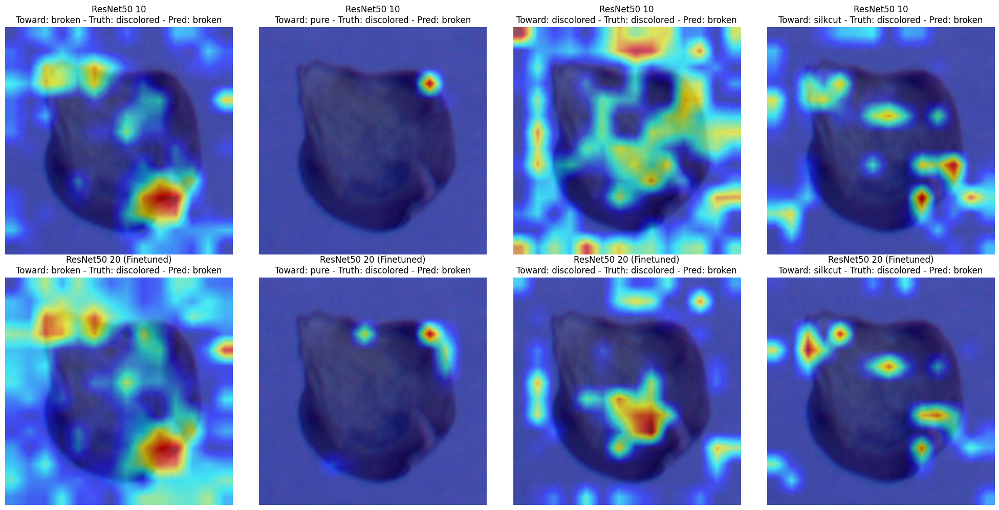

In [133]:
heatmap_layer = model_cnn.encoder.resnet[6]

image, label = val_dataset[227]
print(f"{itol[label]}")
image_tensor = image.unsqueeze(0).to(device)

plot_heatmap_grid_dual(
    model_cnn_10, 
    model_cnn, 
    image_tensor, 
    model_cnn_10.encoder.resnet[6],
    model_cnn.encoder.resnet[6],
    label, 
    "ResNet50 10",
    "ResNet50 20 (Finetuned)"
    )

discolored
tensor([ 0.7159, -0.0591, -0.0896, -0.9850], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([ 0.5819, -0.0548,  0.0341, -1.5741], device='cuda:0',
       grad_fn=<SelectBackward0>)
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1024, 14, 14])


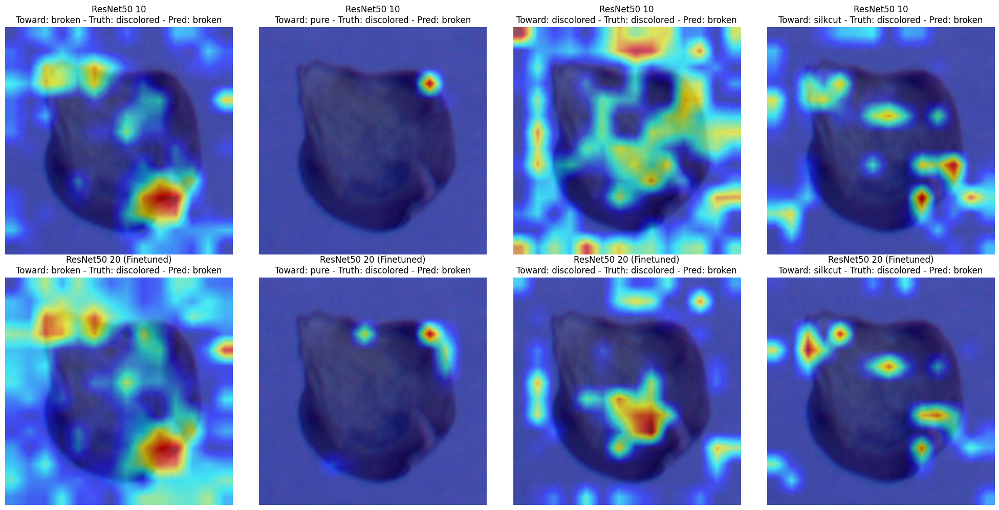

In [134]:
heatmap_layer = model_cnn.encoder.resnet[6]

image, label = val_dataset[227]
print(f"{itol[label]}")
image_tensor = image.unsqueeze(0).to(device)

plot_heatmap_grid_dual(
    model_cnn_10, 
    model_cnn, 
    image_tensor, 
    model_cnn_10.encoder.resnet[6],
    model_cnn.encoder.resnet[6],
    label, 
    "ResNet50 10",
    "ResNet50 20 (Finetuned)"
    )

In [591]:
list(ltoi.keys())

['broken', 'pure', 'discolored', 'silkcut']

#### ViT GRADCAM

In [135]:
from pytorch_grad_cam import GradCAM
import matplotlib.cm as cm
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0),
                                      height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result

def overlay_images(grayscale_cam, image):
    # Add an extra dimension to grayscale_cam
    grayscale_cam = grayscale_cam[..., np.newaxis]

    # Transpose the image
    image_transposed = np.transpose(image.numpy(), (1, 2, 0))

    # Normalize the images to the same scale
    grayscale_cam = (grayscale_cam - np.min(grayscale_cam)) / (np.max(grayscale_cam) - np.min(grayscale_cam))
    image_transposed = (image_transposed - np.min(image_transposed)) / (np.max(image_transposed) - np.min(image_transposed))

    # Convert grayscale image to colored heatmap
    colored_cam = cm.jet(grayscale_cam[..., 0])

    # Overlay the colored heatmap on the original image
    overlay = colored_cam[..., :3] * 0.5 + image_transposed * 0.5

    # Visualize the overlay image
    plt.imshow(overlay)
    plt.show()

def overlay_images_multi(grayscale_cams, image, label, pred, model_name):
    # Transpose the image
    image_transposed = np.transpose(image.numpy(), (1, 2, 0))

    # Normalize the image
    image_transposed = (image_transposed - np.min(image_transposed)) / (np.max(image_transposed) - np.min(image_transposed))

    # Create a subplot with 2 rows and 2 columns
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    for i, grayscale_cam in enumerate(grayscale_cams):
        # Add an extra dimension to grayscale_cam
        grayscale_cam = grayscale_cam[0, :]
        grayscale_cam = grayscale_cam[..., np.newaxis]

        # Normalize the grayscale_cam
        grayscale_cam = (grayscale_cam - np.min(grayscale_cam)) / (np.max(grayscale_cam) - np.min(grayscale_cam))

        # Convert grayscale image to colored heatmap
        colored_cam = cm.jet(grayscale_cam[..., 0])

        # Overlay the colored heatmap on the original image
        overlay = colored_cam[..., :3] * 0.5 + image_transposed * 0.5
        
        axs[i//2, i%2].set_title(f"Toward: {itol[i]} - Truth: {itol[label]} - Pred: {itol[pred]}")

        axs[i//2, i%2].axis('off')
        
        # Visualize the overlay image
        axs[i//2, i%2].imshow(overlay)
        
    plt.suptitle(f"{model_name} Activation map (All frozen)")
    plt.tight_layout()
    plt.show()


Won't return Attn weight
Unfreezing all weights
self.retrain=True
silkcut
tensor([-1.6325, -1.6586,  2.1261,  2.4440], device='cuda:0',
       grad_fn=<SelectBackward0>)


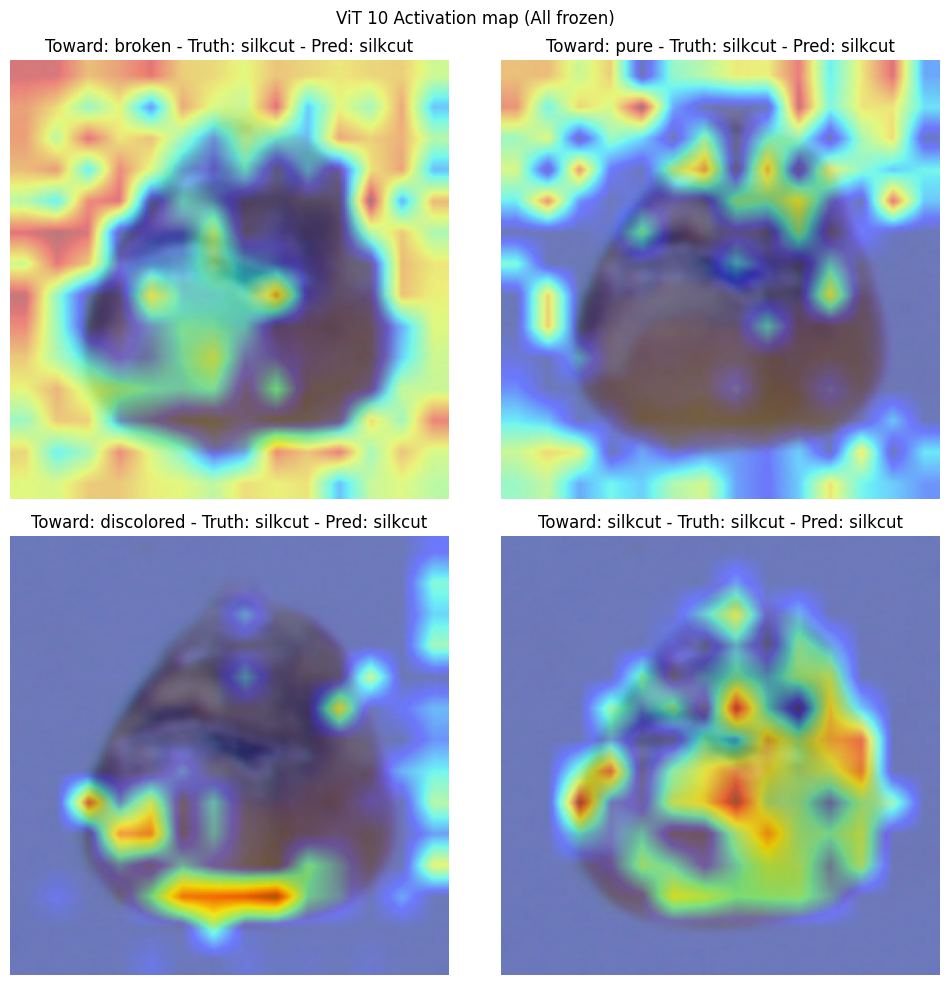

In [138]:
model_vit_10 = model_vit_10.eval()

model_vit_10.toggle_return_attn_weight(False)
model_vit_10.encoder.toggle_train(True)

target_layer = model_vit_10.encoder.model.blocks[-1].norm1
cam = GradCAM(model=model_vit_10, 
                      target_layers=[target_layer], 
                      reshape_transform=reshape_transform)
targets = [ClassifierOutputTarget(i) for i in range(4)]

image, label = val_dataset[335]
print(f"{itol[label]}")
image_tensor = image.unsqueeze(0).to(device)

grayscale_cams = [cam(input_tensor=image_tensor, targets=[target]) for target in targets]

output = model_vit_10(image_tensor)[0]
print(output)
pred = torch.argmax(output).item()

overlay_images_multi(grayscale_cams, image, label, pred, "ViT 10")

Won't return Attn weight
Unfreezing all weights
self.retrain=True
silkcut
tensor([-1.5436, -1.5569,  1.7740,  1.6869], device='cuda:0',
       grad_fn=<SelectBackward0>)


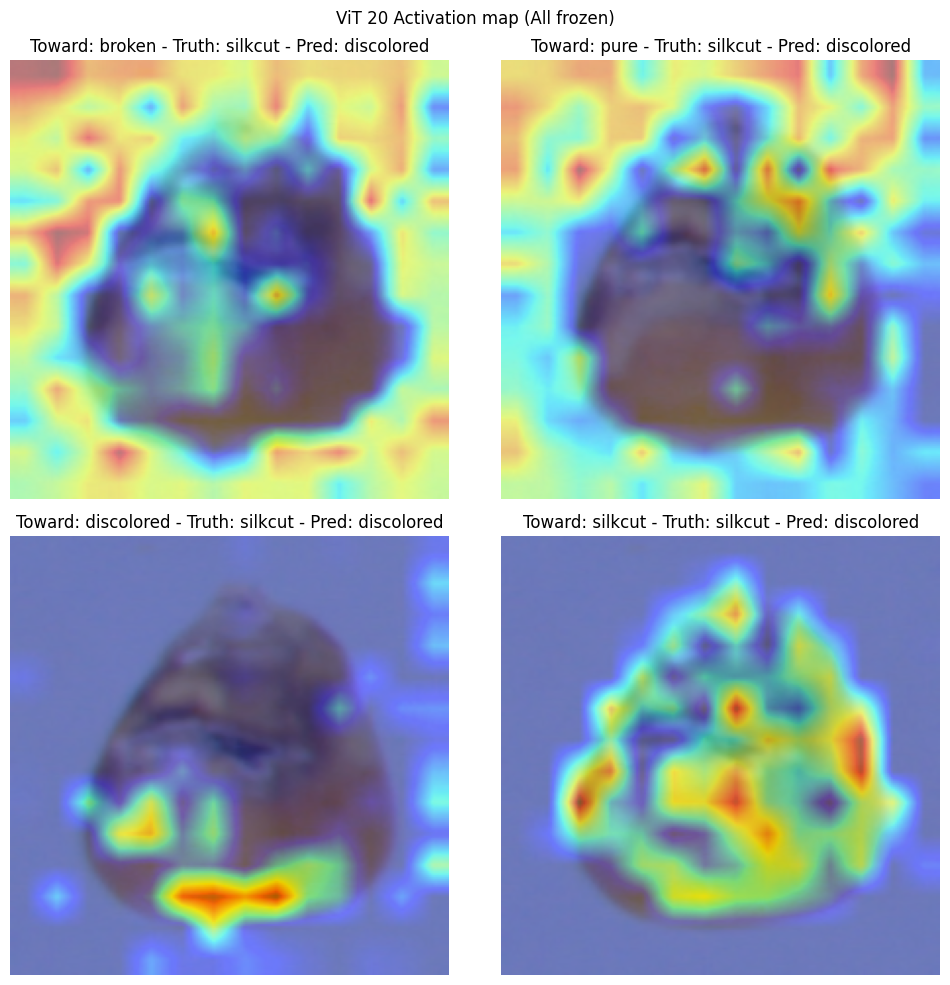

In [137]:
model_vit = model_vit.eval()
model_vit.toggle_return_attn_weight(False)
model_vit.encoder.toggle_train(True)

target_layer = model_vit.encoder.model.blocks[-1].norm1
cam = GradCAM(model=model_vit, 
                      target_layers=[target_layer], 
                      reshape_transform=reshape_transform)
targets = [ClassifierOutputTarget(i) for i in range(4)]

image, label = val_dataset[335]
print(f"{itol[label]}")
image_tensor = image.unsqueeze(0).to(device)

grayscale_cams = [cam(input_tensor=image_tensor, targets=[target]) for target in targets]

output = model_vit(image_tensor)[0]
print(output)
pred = torch.argmax(output).item()

overlay_images_multi(grayscale_cams, image, label, pred, "ViT 20")